In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from sklearn.model_selection import ParameterGrid

In [34]:
df = pd.read_csv('final_combined_dataset.csv')


In [35]:
from sklearn.preprocessing import LabelEncoder


df['week'] = pd.to_numeric(df['week'], errors='coerce')
df['date'] = pd.to_datetime(df['date'])
# Add date_ordinal
df['date_ordinal'] = df['date'].apply(lambda x: x.toordinal())

# Extract year and month
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Add cyclic month representation
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# Add cyclic week representation
df['week_sin'] = np.sin(2 * np.pi * df['week'] / 52)
df['week_cos'] = np.cos(2 * np.pi * df['week'] / 52)

df["year_sin"] = np.sin(2 * np.pi * df["year"] / df["year"].max())
df["year_cos"] = np.cos(2 * np.pi * df["year"] / df["year"].max())

# df["cases_rolling_mean"] = df.groupby("geocode")["cases"].transform(lambda x: x.rolling(4).mean())


# Step 2: Create lag features
def create_lags(dataframe, group_col, target_col, lags, inplace = False):
    if isinstance(target_col, list):  # If target_col is a list of columns
        for col in target_col:
            for lag in lags:
                if inplace:
                    dataframe[target_col] = dataframe.groupby(group_col)[col].shift(lag)
                else:
                    dataframe[f'{col}_lag{lag}'] = dataframe.groupby(group_col)[col].shift(lag)
    else:  # If target_col is a single column
        for lag in lags:
            if inplace:
                dataframe[target_col] = dataframe.groupby(group_col)[target_col].shift(lag)
            else:
                dataframe[f'{target_col}_lag{lag}'] = dataframe.groupby(group_col)[target_col].shift(lag)
    return dataframe

# Lag cases by 1 and 2 weeks
data = create_lags(df, group_col='city', target_col='cases', lags=[0,1,-2])

# Lag weather-related variables by 5 and 6 weeks for each city
weather_columns = ['tempe_min', 'temp_avg', 'temp_max', 'humidity_max', 'humidity_avg', 'humidity_min',
                   'precipitation_avg_ordinary_kriging', 'precipitation_max_ordinary_kriging',
                   'precipitation_avg_regression_kriging', 'precipitation_max_regression_kriging']
data = create_lags(df, group_col='city', target_col=weather_columns, lags=[4, 5, 6])
data = data.dropna().reset_index(drop=True)


from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

ct = ColumnTransformer(transformers=[
    ('onehot', OneHotEncoder(sparse_output=False), ['geocode'])  # One-hot encode 'geocode'
], remainder='passthrough')  # Keep all other columns as is

transformed_data = ct.fit_transform(data)

# Get feature names
feature_names = ct.get_feature_names_out()

# Clean feature names to remove 'remainder__' prefix
cleaned_feature_names = [name.split('__')[-1] if 'remainder__' in name else name for name in feature_names]

# Convert transformed data back to DataFrame
transformed_df = pd.DataFrame(transformed_data, columns=cleaned_feature_names)

numeric_cols = data.select_dtypes(include=['float64', 'int64','int32']).columns
for col in numeric_cols:
    if col in transformed_df.columns:
        transformed_df[col] = pd.to_numeric(transformed_df[col], errors='coerce')

if 'date' in transformed_df.columns:
    transformed_df['date'] = pd.to_datetime(transformed_df['date'], errors='coerce')

data= transformed_df

# Now 'transformed_df' contains the transformed data with the correct types
train_data = data[data['date'].dt.year <= 2020]
test_data = data[data['date'].dt.year >= 2021]
pd.set_option('display.max_columns', None)
train_data


,onehot__geocode_3300100,onehot__geocode_3300159,onehot__geocode_3300209,onehot__geocode_3300225,onehot__geocode_3300233,onehot__geocode_3300258,onehot__geocode_3300308,onehot__geocode_3300407,onehot__geocode_3300456,onehot__geocode_3300506,onehot__geocode_3300605,onehot__geocode_3300704,onehot__geocode_3300803,onehot__geocode_3300902,onehot__geocode_3300936,onehot__geocode_3300951,onehot__geocode_3301009,onehot__geocode_3301108,onehot__geocode_3301157,onehot__geocode_3301207,onehot__geocode_3301306,onehot__geocode_3301405,onehot__geocode_3301504,onehot__geocode_3301603,onehot__geocode_3301702,onehot__geocode_3301801,onehot__geocode_3301850,onehot__geocode_3301876,onehot__geocode_3301900,onehot__geocode_3302007,onehot__geocode_3302056,onehot__geocode_3302106,onehot__geocode_3302205,onehot__geocode_3302254,onehot__geocode_3302270,onehot__geocode_3302304,onehot__geocode_3302403,onehot__geocode_3302452,onehot__geocode_3302502,onehot__geocode_3302601,onehot__geocode_3302700,onehot__geocode_3302809,onehot__geocode_3302908,onehot__geocode_3303005,onehot__geocode_3303104,onehot__geocode_3303203,onehot__geocode_3303302,onehot__geocode_3303401,onehot__geocode_3303500,onehot__geocode_3303609,onehot__geocode_3303708,onehot__geocode_3303807,onehot__geocode_3303856,onehot__geocode_3303906,onehot__geocode_3303955,onehot__geocode_3304003,onehot__geocode_3304102,onehot__geocode_3304110,onehot__geocode_3304128,onehot__geocode_3304144,onehot__geocode_3304151,onehot__geocode_3304201,onehot__geocode_3304300,onehot__geocode_3304409,onehot__geocode_3304508,onehot__geocode_3304524,onehot__geocode_3304557,onehot__geocode_3304607,onehot__geocode_3304706,onehot__geocode_3304755,onehot__geocode_3304805,onehot__geocode_3304904,onehot__geocode_3305000,onehot__geocode_3305109,onehot__geocode_3305133,onehot__geocode_3305158,onehot__geocode_3305208,onehot__geocode_3305307,onehot__geocode_3305406,onehot__geocode_3305505,onehot__geocode_3305554,onehot__geocode_3305604,onehot__geocode_3305703,onehot__geocode_3305752,onehot__geocode_3305802,onehot__geocode_3305901,onehot__geocode_3306008,onehot__geocode_3306107,onehot__geocode_3306156,onehot__geocode_3306206,onehot__geocode_3306305,date,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,date_ordinal,year,month,month_sin,month_cos,week_sin,week_cos,year_sin,year_cos,cases_lag0,cases_lag1,cases_lag-2,tempe_min_lag4,tempe_min_lag5,tempe_min_lag6,temp_avg_lag4,temp_avg_lag5,temp_avg_lag6,temp_max_lag4,temp_max_lag5,temp_max_lag6,humidity_max_lag4,humidity_max_lag5,humidity_max_lag6,humidity_avg_lag4,humidity_avg_lag5,humidity_avg_lag6,humidity_min_lag4,humidity_min_lag5,humidity_min_lag6,precipitation_avg_ordinary_kriging_lag4,precipitation_avg_ordinary_kriging_lag5,precipitation_avg_ordinary_kriging_lag6,precipitation_max_ordinary_kriging_lag4,precipitation_max_ordinary_kriging_lag5,precipitation_max_ordinary_kriging_lag6,precipitation_avg_regression_kriging_lag4,precipitation_avg_regression_kriging_lag5,precipitation_avg_regression_kriging_lag6,precipitation_max_regression_kriging_lag4,precipitation_max_regression_kriging_lag5,precipitation_max_regression_kriging_lag6
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2012-02-12,201207,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,734545,2012,2,8.660254e-01,5.000000e-01,0.748511,-0.66

In [36]:
X_train = train_data.drop(columns=['cases','cases_per_100k','cases_lag-2'])
y_train = train_data[['cases_lag-2']]

X_test = test_data.drop(columns=['cases','cases_per_100k','cases_lag-2'])
y_test = test_data[['cases_lag-2']]

data = data.drop(columns=['cases_per_100k'])

data

,onehot__geocode_3300100,onehot__geocode_3300159,onehot__geocode_3300209,onehot__geocode_3300225,onehot__geocode_3300233,onehot__geocode_3300258,onehot__geocode_3300308,onehot__geocode_3300407,onehot__geocode_3300456,onehot__geocode_3300506,onehot__geocode_3300605,onehot__geocode_3300704,onehot__geocode_3300803,onehot__geocode_3300902,onehot__geocode_3300936,onehot__geocode_3300951,onehot__geocode_3301009,onehot__geocode_3301108,onehot__geocode_3301157,onehot__geocode_3301207,onehot__geocode_3301306,onehot__geocode_3301405,onehot__geocode_3301504,onehot__geocode_3301603,onehot__geocode_3301702,onehot__geocode_3301801,onehot__geocode_3301850,onehot__geocode_3301876,onehot__geocode_3301900,onehot__geocode_3302007,onehot__geocode_3302056,onehot__geocode_3302106,onehot__geocode_3302205,onehot__geocode_3302254,onehot__geocode_3302270,onehot__geocode_3302304,onehot__geocode_3302403,onehot__geocode_3302452,onehot__geocode_3302502,onehot__geocode_3302601,onehot__geocode_3302700,onehot__geocode_3302809,onehot__geocode_3302908,onehot__geocode_3303005,onehot__geocode_3303104,onehot__geocode_3303203,onehot__geocode_3303302,onehot__geocode_3303401,onehot__geocode_3303500,onehot__geocode_3303609,onehot__geocode_3303708,onehot__geocode_3303807,onehot__geocode_3303856,onehot__geocode_3303906,onehot__geocode_3303955,onehot__geocode_3304003,onehot__geocode_3304102,onehot__geocode_3304110,onehot__geocode_3304128,onehot__geocode_3304144,onehot__geocode_3304151,onehot__geocode_3304201,onehot__geocode_3304300,onehot__geocode_3304409,onehot__geocode_3304508,onehot__geocode_3304524,onehot__geocode_3304557,onehot__geocode_3304607,onehot__geocode_3304706,onehot__geocode_3304755,onehot__geocode_3304805,onehot__geocode_3304904,onehot__geocode_3305000,onehot__geocode_3305109,onehot__geocode_3305133,onehot__geocode_3305158,onehot__geocode_3305208,onehot__geocode_3305307,onehot__geocode_3305406,onehot__geocode_3305505,onehot__geocode_3305554,onehot__geocode_3305604,onehot__geocode_3305703,onehot__geocode_3305752,onehot__geocode_3305802,onehot__geocode_3305901,onehot__geocode_3306008,onehot__geocode_3306107,onehot__geocode_3306156,onehot__geocode_3306206,onehot__geocode_3306305,date,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,nearby_cases_weighted,date_ordinal,year,month,month_sin,month_cos,week_sin,week_cos,year_sin,year_cos,cases_lag0,cases_lag1,cases_lag-2,tempe_min_lag4,tempe_min_lag5,tempe_min_lag6,temp_avg_lag4,temp_avg_lag5,temp_avg_lag6,temp_max_lag4,temp_max_lag5,temp_max_lag6,humidity_max_lag4,humidity_max_lag5,humidity_max_lag6,humidity_avg_lag4,humidity_avg_lag5,humidity_avg_lag6,humidity_min_lag4,humidity_min_lag5,humidity_min_lag6,precipitation_avg_ordinary_kriging_lag4,precipitation_avg_ordinary_kriging_lag5,precipitation_avg_ordinary_kriging_lag6,precipitation_max_ordinary_kriging_lag4,precipitation_max_ordinary_kriging_lag5,precipitation_max_ordinary_kriging_lag6,precipitation_avg_regression_kriging_lag4,precipitation_avg_regression_kriging_lag5,precipitation_avg_regression_kriging_lag6,precipitation_max_regression_kriging_lag4,precipitation_max_regression_kriging_lag5,precipitation_max_regression_kriging_lag6
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2012-02-12,201207,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,12.823065,734545,2012,2,8.660254e-01,5.000000e-01,0.748511,-0.663123,-3.106911e-02,0.9995

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import GridSearchCV

# Step 1-6: Keep the previous preprocessing steps the same (data preparation, scaling, etc.)
columns_not_to_scale = ['week_sin', 'week_cos', 'month_sin', 'month_cos', 'week', 'lat', 'long', 
                    'geocode', 'year_sin', 'year_cos'] + [col for col in data.columns if col.startswith('onehot__geocode_')]

feature_cols = [
    'cases_lag0', 'cases_lag1',
    'temp_avg_lag4', 'humidity_avg_lag4',
    'precipitation_max_regression_kriging_lag4',
    'week_sin', 'month_sin', 'week_cos', 'month_cos',
    'year_sin', 'year_cos'
]

selected_columns = feature_cols + [col for col in data.columns if col.startswith('onehot_')]

X_train = X_train[selected_columns]
X_test = X_test[selected_columns]

feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

numeric_features = [col for col in X_train.columns if X_train[col].dtype in ['float64', 'int64', 'float32', 'int32'] 
                   and col not in columns_not_to_scale]

X_train[numeric_features] = feature_scaler.fit_transform(X_train[numeric_features])
X_test[numeric_features] = feature_scaler.transform(X_test[numeric_features])

y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

y_train_scaled = target_scaler.fit_transform(y_train_reshaped).ravel()
y_test_scaled = target_scaler.transform(y_test_reshaped).ravel()

X_train

,cases_lag0,cases_lag1,temp_avg_lag4,humidity_avg_lag4,precipitation_max_regression_kriging_lag4,week_sin,month_sin,week_cos,month_cos,year_sin,year_cos,onehot__geocode_3300100,onehot__geocode_3300159,onehot__geocode_3300209,onehot__geocode_3300225,onehot__geocode_3300233,onehot__geocode_3300258,onehot__geocode_3300308,onehot__geocode_3300407,onehot__geocode_3300456,onehot__geocode_3300506,onehot__geocode_3300605,onehot__geocode_3300704,onehot__geocode_3300803,onehot__geocode_3300902,onehot__geocode_3300936,onehot__geocode_3300951,onehot__geocode_3301009,onehot__geocode_3301108,onehot__geocode_3301157,onehot__geocode_3301207,onehot__geocode_3301306,onehot__geocode_3301405,onehot__geocode_3301504,onehot__geocode_3301603,onehot__geocode_3301702,onehot__geocode_3301801,onehot__geocode_3301850,onehot__geocode_3301876,onehot__geocode_3301900,onehot__geocode_3302007,onehot__geocode_3302056,onehot__geocode_3302106,onehot__geocode_3302205,onehot__geocode_3302254,onehot__geocode_3302270,onehot__geocode_3302304,onehot__geocode_3302403,onehot__geocode_3302452,onehot__geocode_3302502,onehot__geocode_3302601,onehot__geocode_3302700,onehot__geocode_3302809,onehot__geocode_3302908,onehot__geocode_3303005,onehot__geocode_3303104,onehot__geocode_3303203,onehot__geocode_3303302,onehot__geocode_3303401,onehot__geocode_3303500,onehot__geocode_3303609,onehot__geocode_3303708,onehot__geocode_3303807,onehot__geocode_3303856,onehot__geocode_3303906,onehot__geocode_3303955,onehot__geocode_3304003,onehot__geocode_3304102,onehot__geocode_3304110,onehot__geocode_3304128,onehot__geocode_3304144,onehot__geocode_3304151,onehot__geocode_3304201,onehot__geocode_3304300,onehot__geocode_3304409,onehot__geocode_3304508,onehot__geocode_3304524,onehot__geocode_3304557,onehot__geocode_3304607,onehot__geocode_3304706,onehot__geocode_3304755,onehot__geocode_3304805,onehot__geocode_3304904,onehot__geocode_3305000,onehot__geocode_3305109,onehot__geocode_3305133,onehot__geocode_3305158,onehot__geocode_3305208,onehot__geocode_3305307,onehot__geocode_3305406,onehot__geocode_3305505,onehot__geocode_3305554,onehot__geocode_3305604,onehot__geocode_3305703,onehot__geocode_3305752,onehot__geocode_3305802,onehot__geocode_3305901,onehot__geocode_3306008,onehot__geocode_3306107,onehot__geocode_3306156,onehot__geocode_3306206,onehot__geocode_3306305
0,0.002516,0.002652,0.676283,0.164814,0.050450,0.748511,8.660254e-01,-0.663123,5.000000e-01,-0.031069,0.999517,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.002244,0.002516,0.696355,0.134769,0.084866,0.663123,8.660254e-01,-0.748511,5.000000e-01,-0.031069,0.999517,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.003128,0.002244,0.744210,0.076346,0.126653,0.568065,8.660254e-01,-0.822984,5.000000e-01,-0.031069,0.999517,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.002856,0.003128,0.857288,0.030776,0.418930,0.464723,1.000000e+00,-0.885456,6.123234e-17,-0.031069,0.999517,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best Random Forest Parameters: {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 50}
Train RMSE: 53.45869890415148
Test RMSE: 6.473842233861287
Train R²: 0.946032815299209
Test R²: 0.8287170021985917
Mean Absolute Error (MAE): 1.7292449206029092
Mean Absolute Percentage Error (MAPE): 1.5293695107838502e+17 %


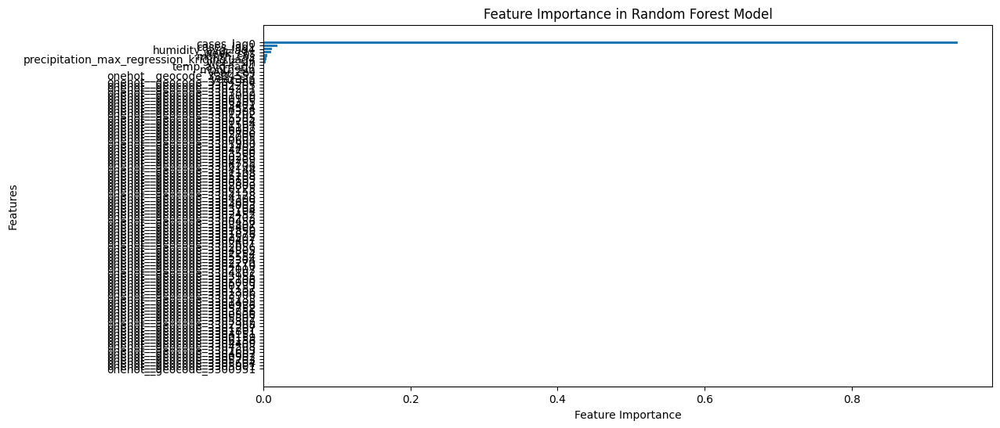

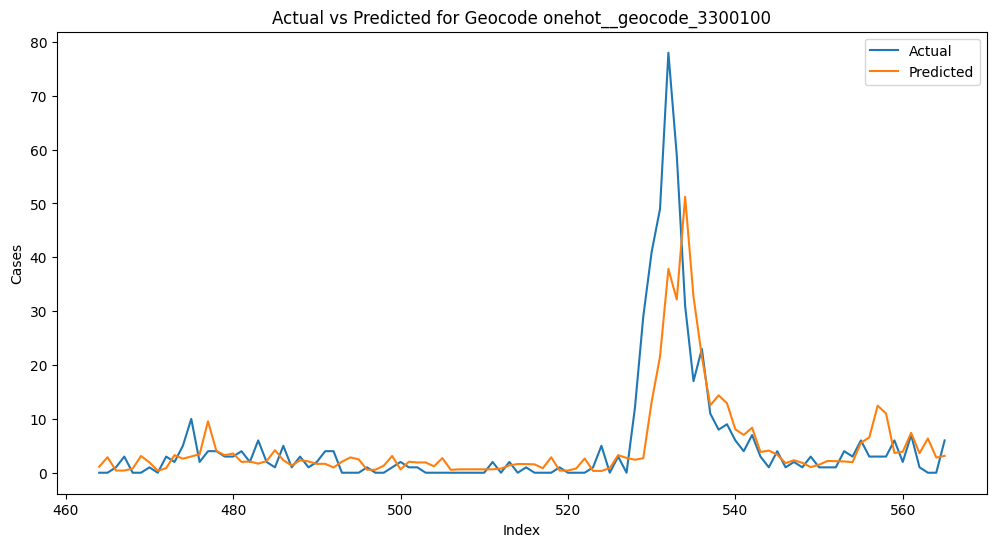

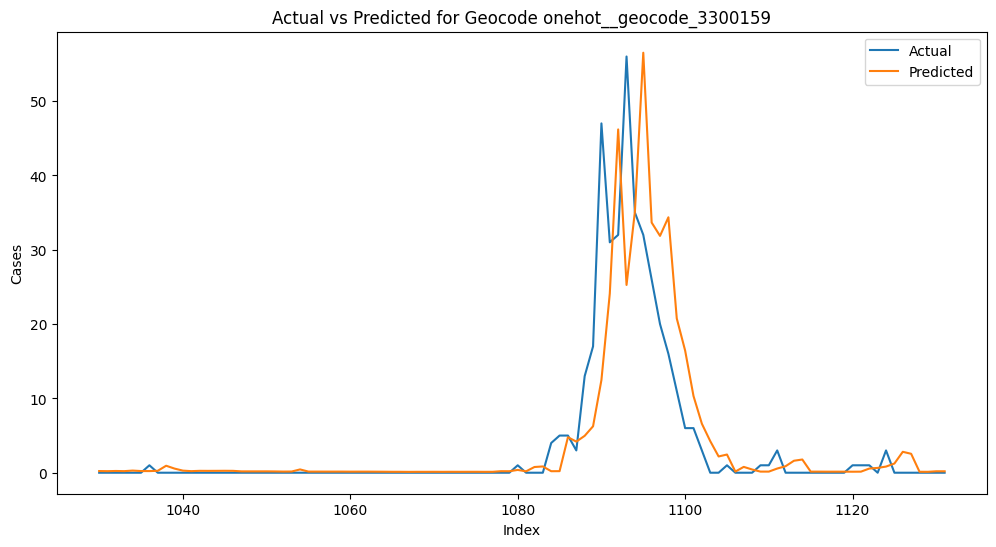

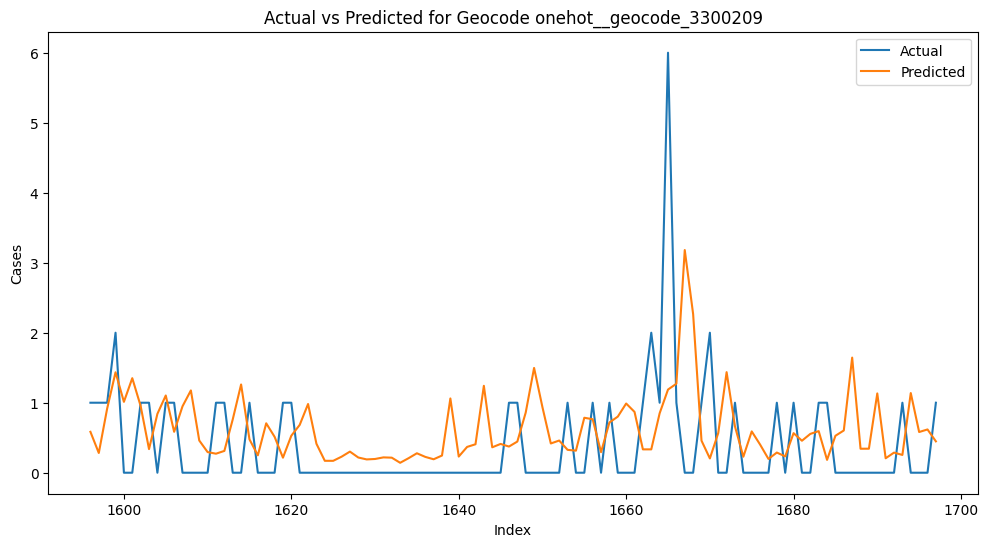

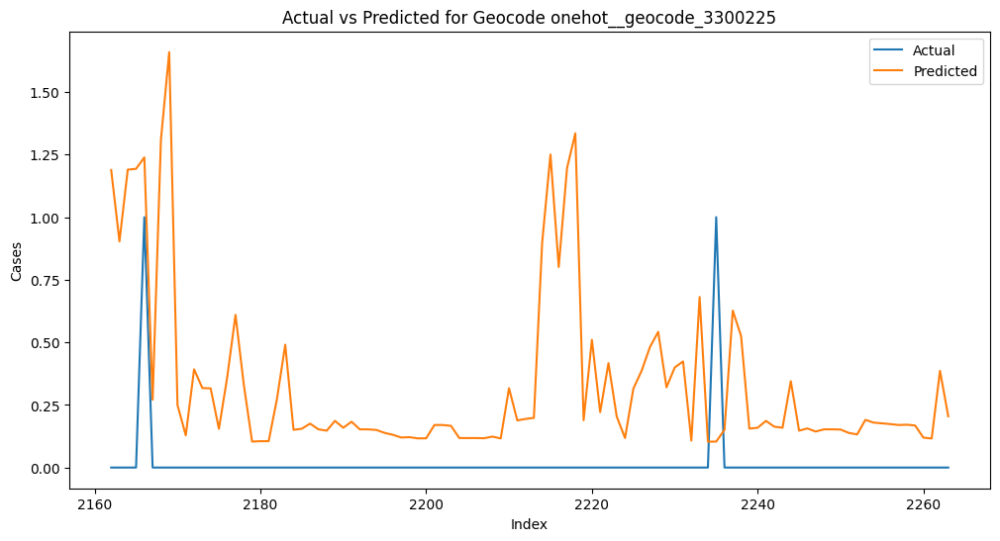

...

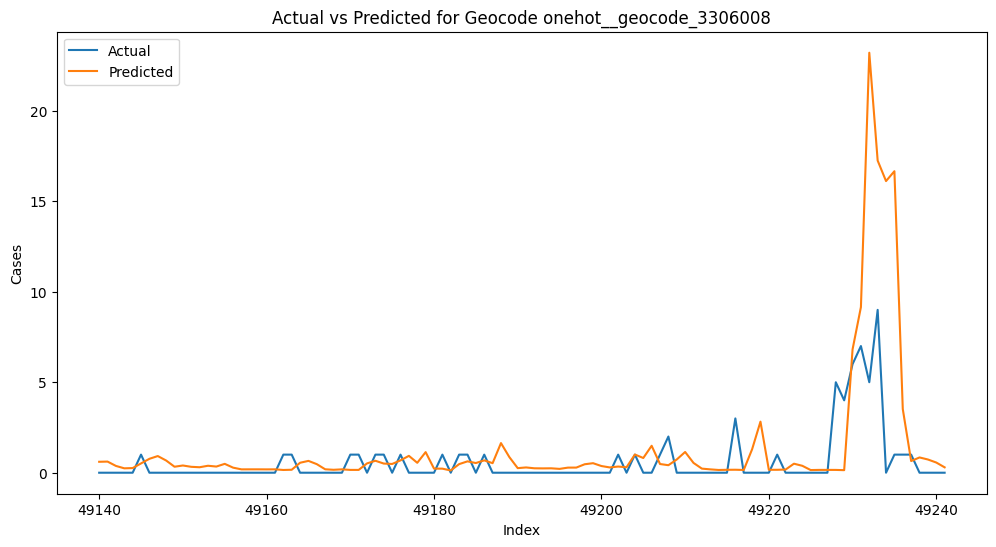

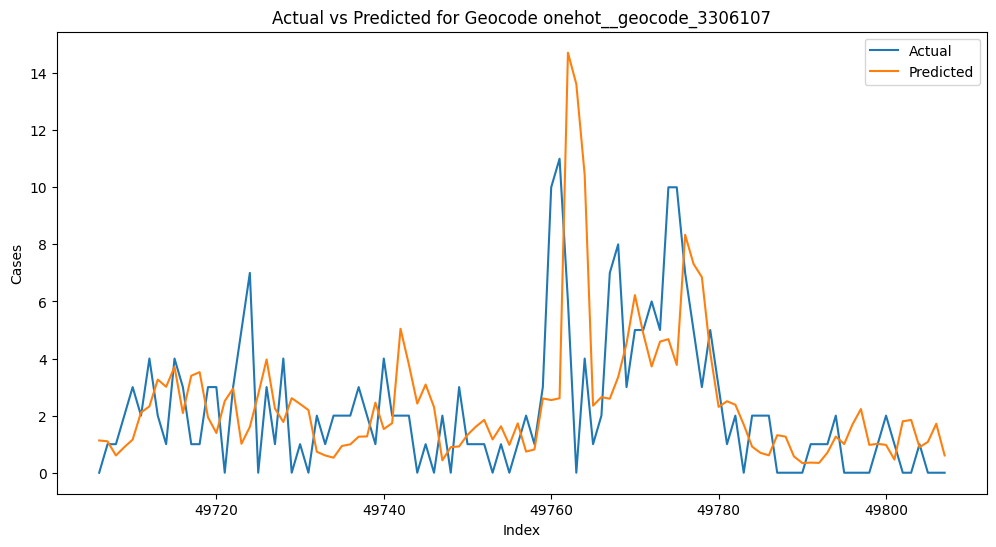

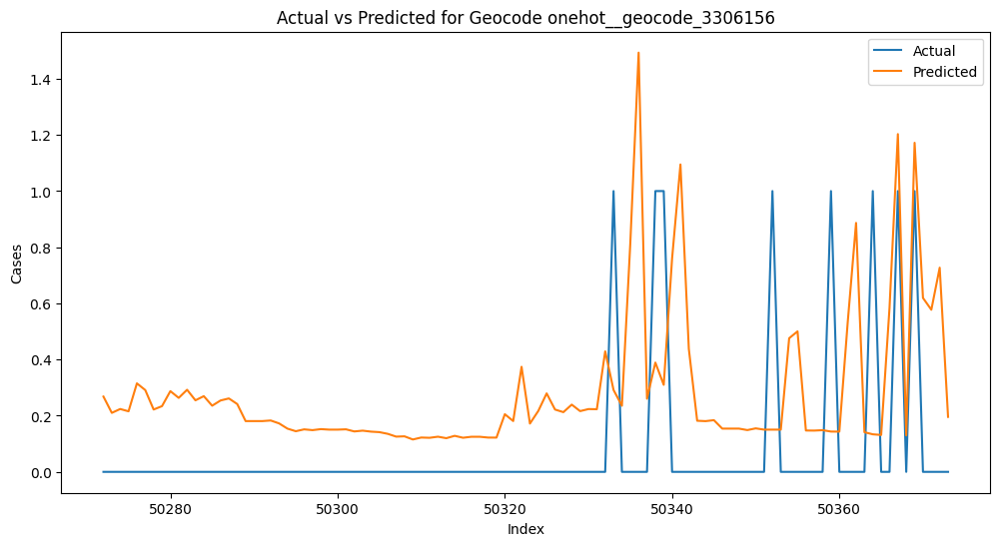

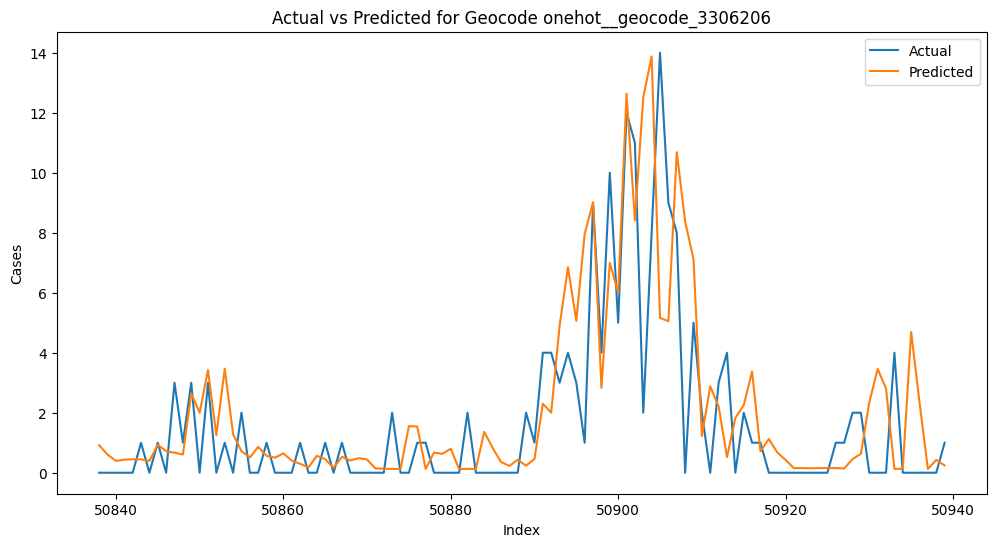

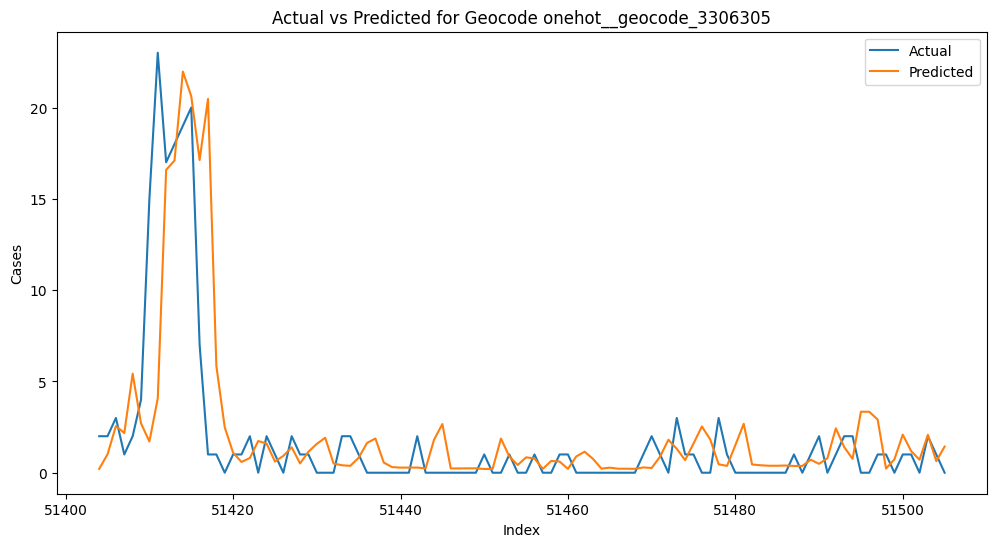

In [39]:
# Define parameter grid for Random Forest
grid_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestRegressor()
grid_search = GridSearchCV(rf, grid_params, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train_scaled)

best_model = grid_search.best_estimator_

# Predictions
y_train_pred_scaled = best_model.predict(X_train)
y_test_pred_scaled = best_model.predict(X_test)

y_train_pred = target_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).ravel()
y_test_pred = target_scaler.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).ravel()
y_train_original = target_scaler.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

# Calculate performance metrics
train_rmse = np.sqrt(mean_squared_error(y_train_original, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test_original, y_test_pred))
train_r2 = r2_score(y_train_original, y_train_pred)
test_r2 = r2_score(y_test_original, y_test_pred)

mae = mean_absolute_error(y_test_original, y_test_pred)
mape = mean_absolute_percentage_error(y_test_original, y_test_pred)

# Print best parameters and metrics
print("Best Random Forest Parameters:", grid_search.best_params_)
print("Train RMSE:", train_rmse)
print("Test RMSE:", test_rmse)
print("Train R²:", train_r2)
print("Test R²:", test_r2)
print("Mean Absolute Error (MAE):", mae)
print("Mean Absolute Percentage Error (MAPE):", mape * 100, "%")

# Feature Importance
feature_importances = best_model.feature_importances_
importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Random Forest Model")
plt.gca().invert_yaxis()
plt.show()

# Prepare test dataframe with results
X_test_df = pd.DataFrame(X_test, columns=selected_columns)
X_test_df["actual"] = y_test_original
X_test_df["predicted"] = y_test_pred

# Plot Actual vs Predicted for each one-hot encoded geocode column
for geocode in X_test_df.columns:
    if geocode.startswith('onehot__geocode_'):
        subset = X_test_df[X_test_df[geocode] == 1]
        plt.figure(figsize=(12, 6))
        plt.plot(subset.index, subset["actual"], label='Actual')
        plt.plot(subset.index, subset["predicted"], label='Predicted')
        plt.xlabel("Index")
        plt.ylabel("Cases")
        plt.title(f"Actual vs Predicted for Geocode {geocode}")
        plt.legend()
        plt.show()


In [24]:
X_test

,onehot__geocode_3300100,onehot__geocode_3300159,onehot__geocode_3300209,onehot__geocode_3300225,onehot__geocode_3300233,onehot__geocode_3300258,onehot__geocode_3300308,onehot__geocode_3300407,onehot__geocode_3300456,onehot__geocode_3300506,onehot__geocode_3300605,onehot__geocode_3300704,onehot__geocode_3300803,onehot__geocode_3300902,onehot__geocode_3300936,onehot__geocode_3300951,onehot__geocode_3301009,onehot__geocode_3301108,onehot__geocode_3301157,onehot__geocode_3301207,onehot__geocode_3301306,onehot__geocode_3301405,onehot__geocode_3301504,onehot__geocode_3301603,onehot__geocode_3301702,onehot__geocode_3301801,onehot__geocode_3301850,onehot__geocode_3301876,onehot__geocode_3301900,onehot__geocode_3302007,onehot__geocode_3302056,onehot__geocode_3302106,onehot__geocode_3302205,onehot__geocode_3302254,onehot__geocode_3302270,onehot__geocode_3302304,onehot__geocode_3302403,onehot__geocode_3302452,onehot__geocode_3302502,onehot__geocode_3302601,onehot__geocode_3302700,onehot__geocode_3302809,onehot__geocode_3302908,onehot__geocode_3303005,onehot__geocode_3303104,onehot__geocode_3303203,onehot__geocode_3303302,onehot__geocode_3303401,onehot__geocode_3303500,onehot__geocode_3303609,onehot__geocode_3303708,onehot__geocode_3303807,onehot__geocode_3303856,onehot__geocode_3303906,onehot__geocode_3303955,onehot__geocode_3304003,onehot__geocode_3304102,onehot__geocode_3304110,onehot__geocode_3304128,onehot__geocode_3304144,onehot__geocode_3304151,onehot__geocode_3304201,onehot__geocode_3304300,onehot__geocode_3304409,onehot__geocode_3304508,onehot__geocode_3304524,onehot__geocode_3304557,onehot__geocode_3304607,onehot__geocode_3304706,onehot__geocode_3304755,onehot__geocode_3304805,onehot__geocode_3304904,onehot__geocode_3305000,onehot__geocode_3305109,onehot__geocode_3305133,onehot__geocode_3305158,onehot__geocode_3305208,onehot__geocode_3305307,onehot__geocode_3305406,onehot__geocode_3305505,onehot__geocode_3305554,onehot__geocode_3305604,onehot__geocode_3305703,onehot__geocode_3305752,onehot__geocode_3305802,onehot__geocode_3305901,onehot__geocode_3306008,onehot__geocode_3306107,onehot__geocode_3306156,onehot__geocode_3306206,onehot__geocode_3306305,date,week,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,nearby_cases_weighted,date_ordinal,year,month,month_sin,month_cos,week_sin,week_cos,year_sin,year_cos,cases_lag0,cases_lag1,tempe_min_lag4,tempe_min_lag5,tempe_min_lag6,temp_avg_lag4,temp_avg_lag5,temp_avg_lag6,temp_max_lag4,temp_max_lag5,temp_max_lag6,humidity_max_lag4,humidity_max_lag5,humidity_max_lag6,humidity_avg_lag4,humidity_avg_lag5,humidity_avg_lag6,humidity_min_lag4,humidity_min_lag5,humidity_min_lag6,precipitation_avg_ordinary_kriging_lag4,precipitation_avg_ordinary_kriging_lag5,precipitation_avg_ordinary_kriging_lag6,precipitation_max_ordinary_kriging_lag4,precipitation_max_ordinary_kriging_lag5,precipitation_max_ordinary_kriging_lag6,precipitation_avg_regression_kriging_lag4,precipitation_avg_regression_kriging_lag5,precipitation_avg_regression_kriging_lag6,precipitation_max_regression_kriging_lag4,precipitation_max_regression_kriging_lag5,precipitation_max_regression_kriging_lag6
464,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021-01-03,202101,207044,20.571429,93.220059,71.354385,51.797334,26.159341,31.142857,angra dos reis,0.855700,0.858233,3.4918,14.5038,2.8288,14.1979,-44.319627,-23.009116,2.158316,737793,2021,1,5.000000e-01,0.866025,-0.354605,-0.935016,-3.107406e-03,0.999995,1,0.0,19.700000,19.4

n_estimators: 100, max_depth: 10, min_samples_split: 5, min_samples_leaf: 1, RMSE: 6.5857


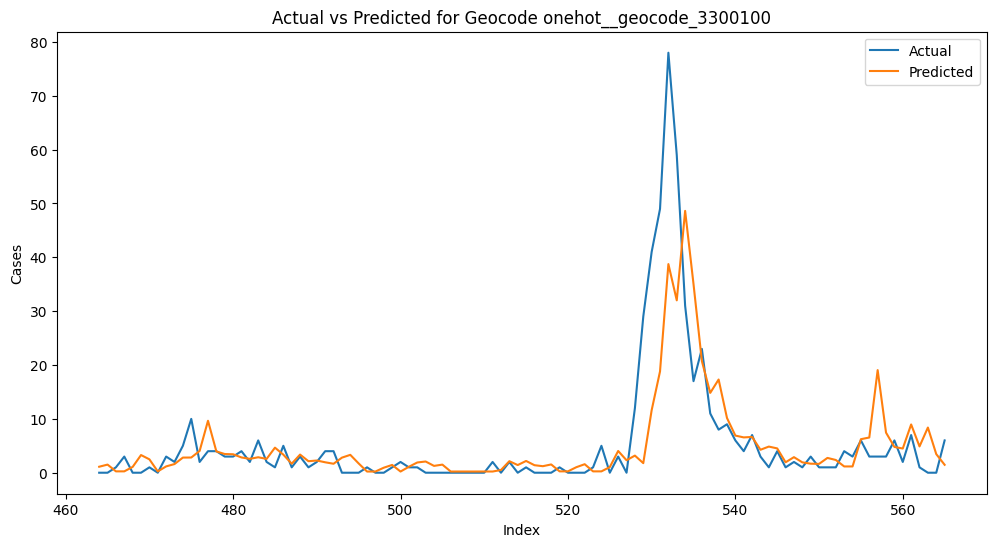

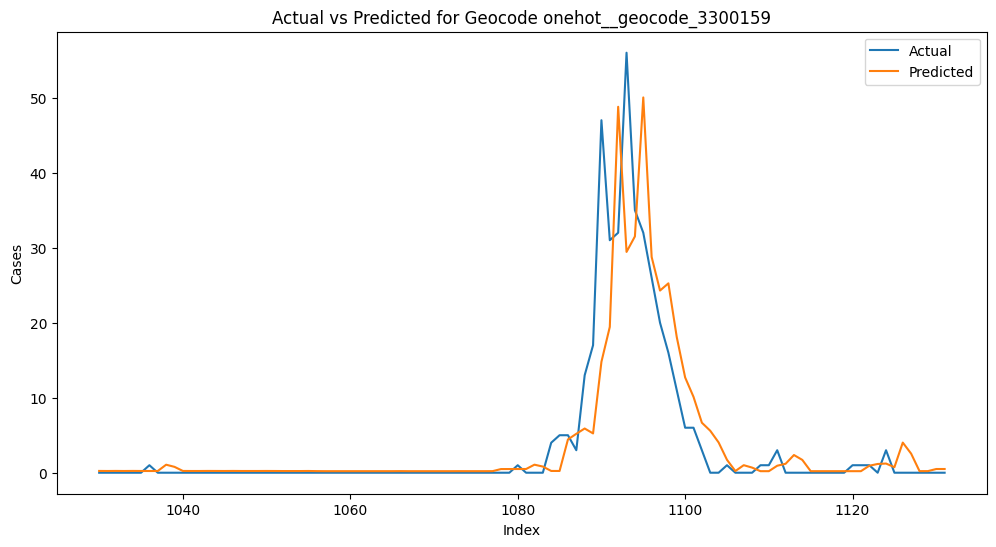

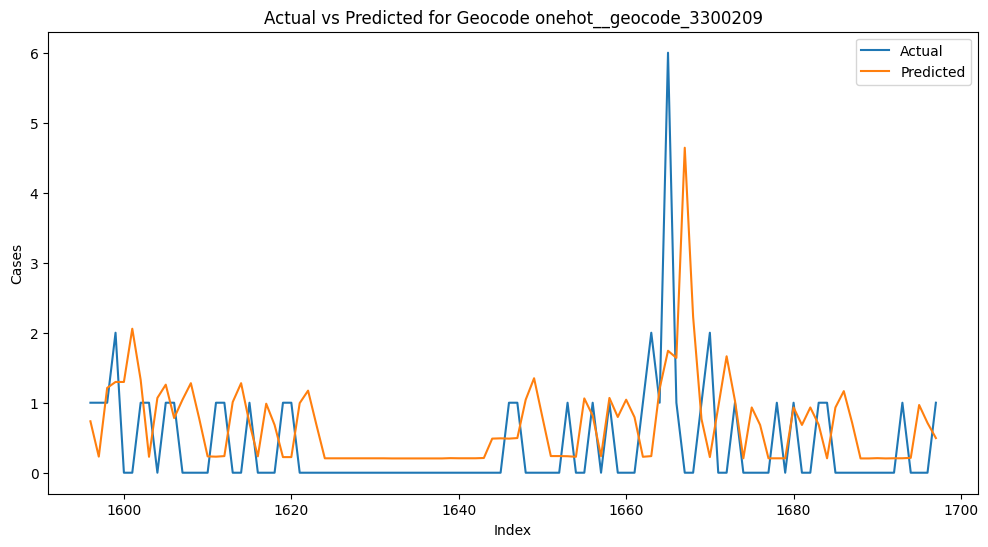

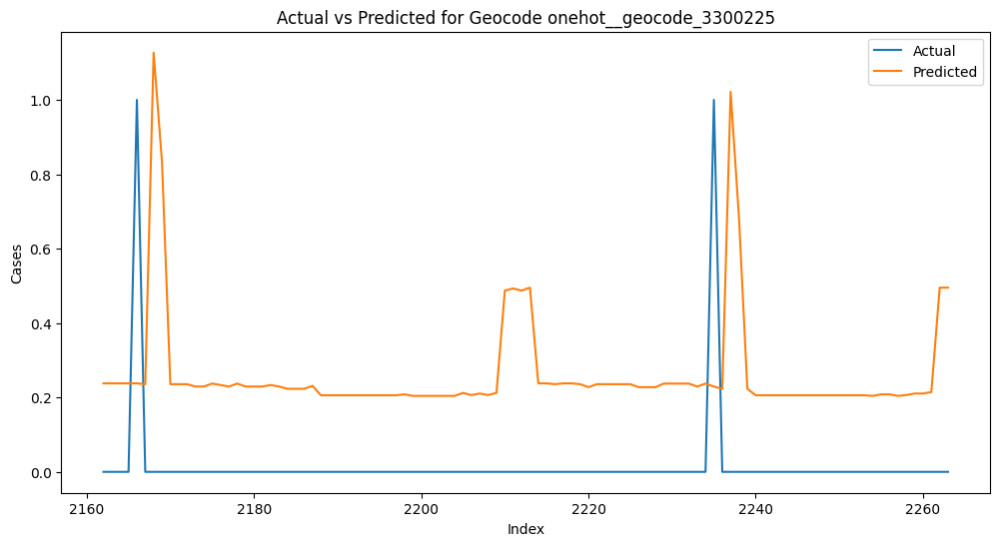

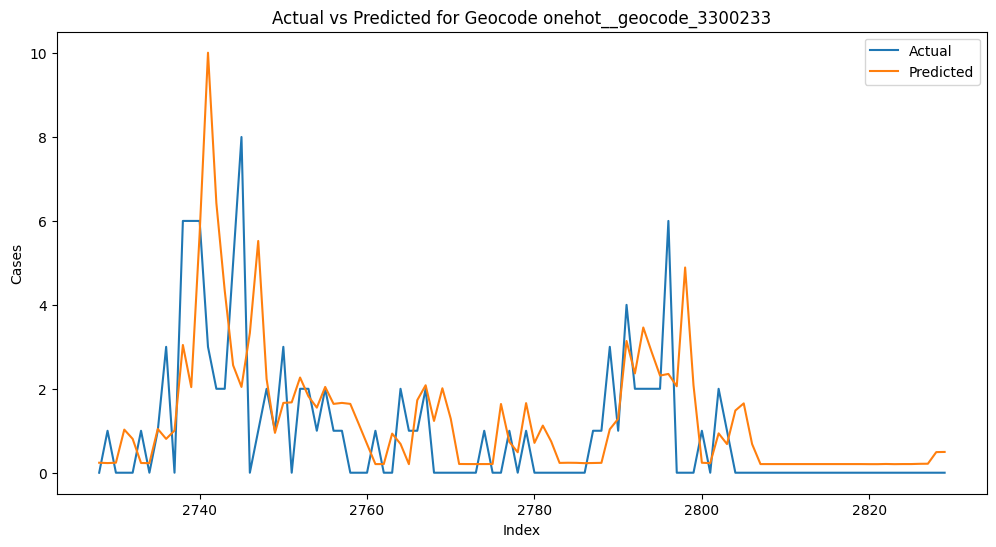

...

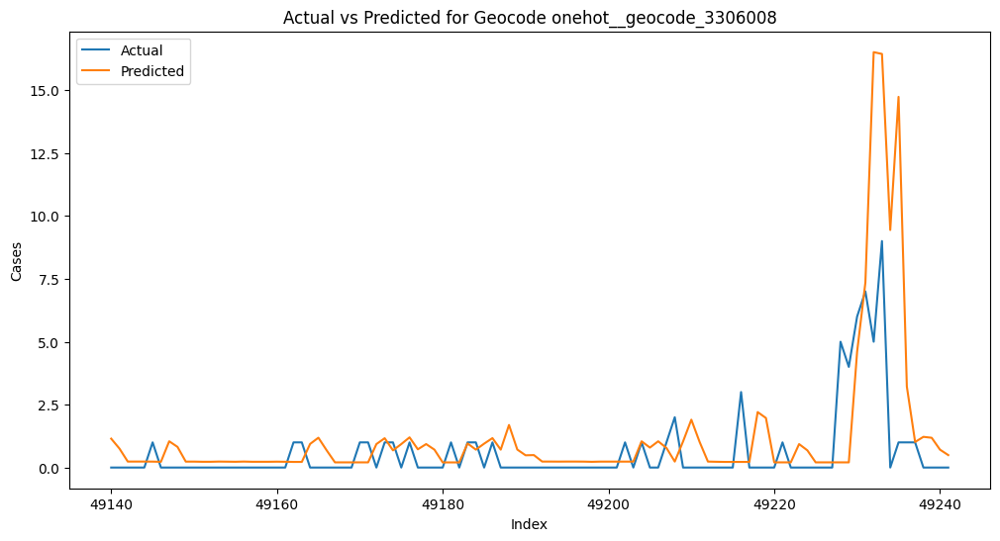

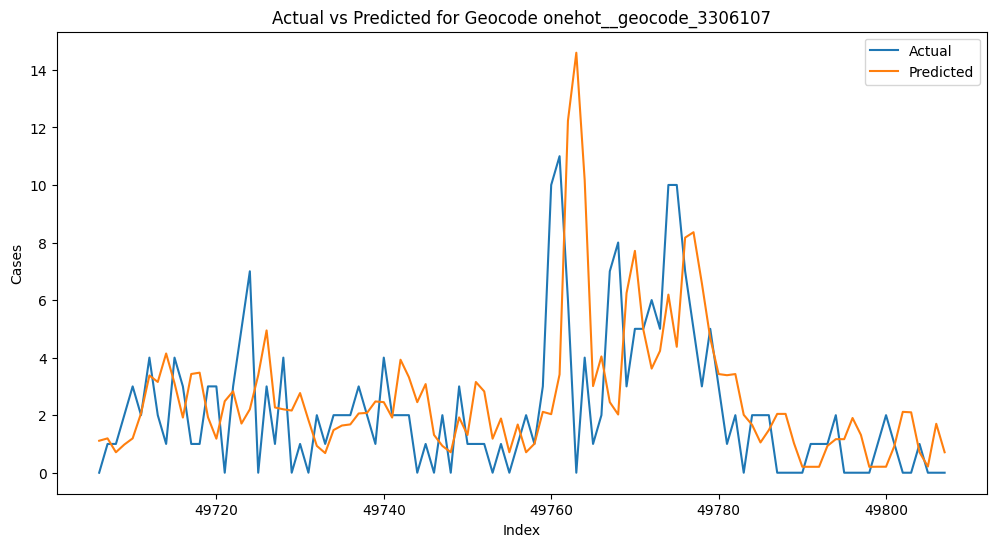

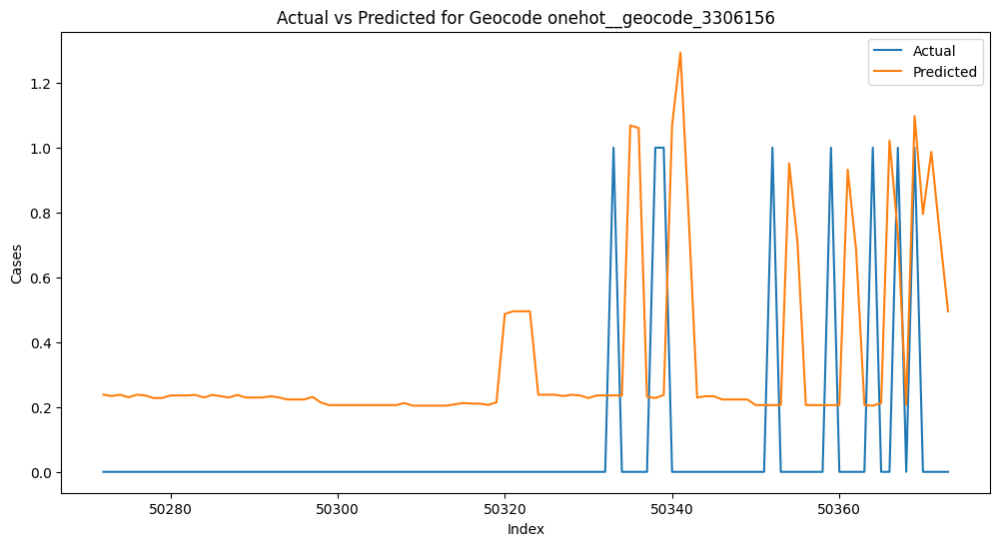

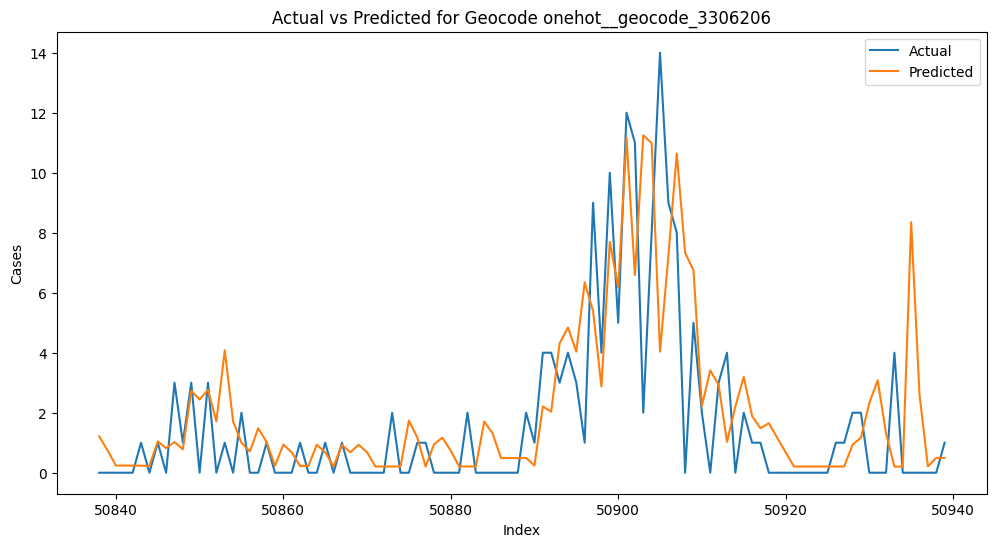

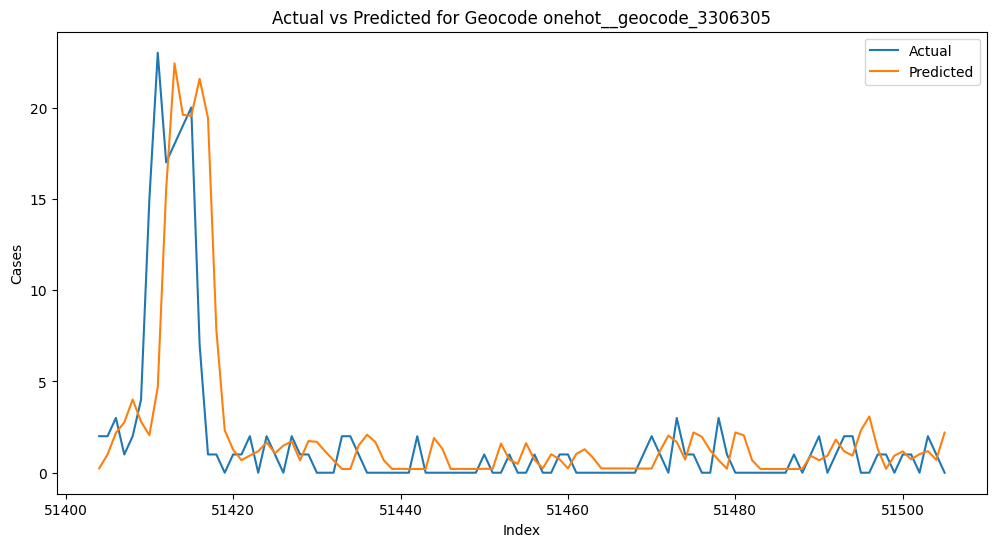

Best Random Forest Parameters: {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1}
Best RMSE: 6.585671129965544
R-squared (R²) for the train set: 0.9807
R-squared (R²) for the test set: 0.8227
Mean Absolute Error (MAE): 1.7610971908911763
Mean Absolute Percentage Error (MAPE): 1.677857188972539e+17 %
                    feature  importance
0                cases_lag0    0.901948
1                cases_lag1    0.025523
7                  week_cos    0.024341
3         humidity_avg_lag4    0.013130
5                  week_sin    0.009988
..                      ...         ...
65  onehot__geocode_3303955    0.000000
20  onehot__geocode_3300506    0.000000
78  onehot__geocode_3304607    0.000000
12  onehot__geocode_3300159    0.000000
25  onehot__geocode_3300936    0.000000

[102 rows x 2 columns]


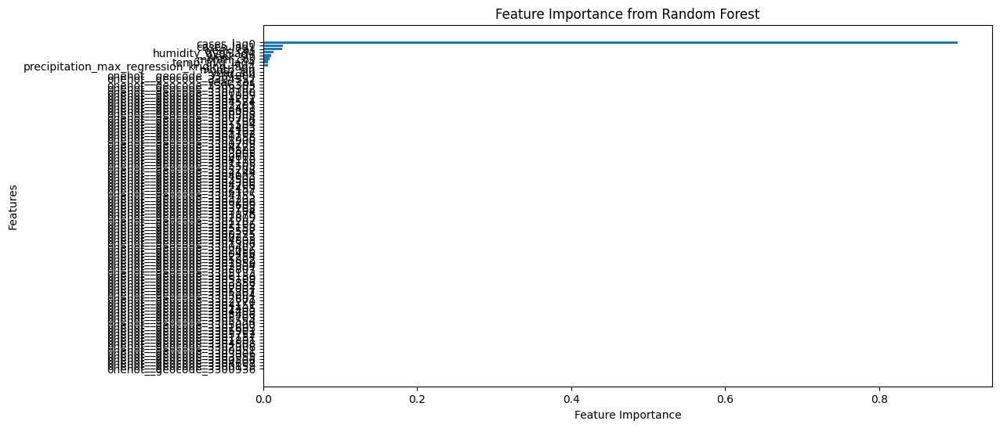

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Step 1-6: Keep preprocessing steps the same (scaling, encoding, etc.)
columns_to_scale = ['week_sin', 'week_cos', 'month_sin', 'month_cos', 'week', 'lat', 'long', 
                    'geocode', 'year_sin', 'year_cos'] + [col for col in data.columns if col.startswith('onehot__geocode_')]

feature_cols = [
    'cases_lag0', 'cases_lag1',
    'temp_avg_lag4', 'humidity_avg_lag4',
    'precipitation_max_regression_kriging_lag4',
    'week_sin', 'month_sin', 'week_cos', 'month_cos',
    'year_sin', 'year_cos'
]

selected_columns = feature_cols + [col for col in data.columns if col.startswith('onehot_')]
X_train = X_train[selected_columns]
X_test = X_test[selected_columns]

feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

numeric_features = [col for col in X_train.columns if X_train[col].dtype in ['float64', 'int64', 'float32', 'int32'] 
                   and not col.startswith('onehot_')]

X_train[numeric_features] = feature_scaler.fit_transform(X_train[numeric_features])
X_test[numeric_features] = feature_scaler.transform(X_test[numeric_features])

y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

y_train_scaled = target_scaler.fit_transform(y_train_reshaped).ravel()
y_test_scaled = target_scaler.transform(y_test_reshaped).ravel()

# Hyperparameter tuning for Random Forest
best_model = None
best_rmse = float('inf')
best_params = None

n_estimators_values = [100]
max_depth_values = [10]
min_samples_split_values = [5]
min_samples_leaf_values = [1]

for n_estimators in n_estimators_values:
    for max_depth in max_depth_values:
        for min_samples_split in min_samples_split_values:
            for min_samples_leaf in min_samples_leaf_values:
                rf = RandomForestRegressor(
                    n_estimators=n_estimators, 
                    max_depth=max_depth, 
                    min_samples_split=min_samples_split,
                    min_samples_leaf=min_samples_leaf,
                    n_jobs=-1,
                    random_state=42
                )
                
                rf.fit(X_train, y_train_scaled)
                y_pred_scaled = rf.predict(X_test)
                
                y_pred = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
                y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()
                
                rmse = np.sqrt(mean_squared_error(y_test_original, y_pred))
                print(f"n_estimators: {n_estimators}, max_depth: {max_depth}, min_samples_split: {min_samples_split}, min_samples_leaf: {min_samples_leaf}, RMSE: {rmse:.4f}")
                
                if rmse < best_rmse:
                    best_rmse = rmse
                    best_model = rf
                    best_params = {
                        'n_estimators': n_estimators,
                        'max_depth': max_depth,
                        'min_samples_split': min_samples_split,
                        'min_samples_leaf': min_samples_leaf
                    }

# Final predictions using the best model
y_pred_scaled = best_model.predict(X_test)
y_pred = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

y_train_pred_scaled = best_model.predict(X_train)
y_train_pred = target_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).ravel()
y_train_original = target_scaler.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
from sklearn.metrics import r2_score

# Calculate R-squared (R²) for the train set


X_test_df = pd.DataFrame(X_test, columns=selected_columns)
X_test_df["actual"] = y_test_original
X_test_df["predicted"] = y_pred

# Plot Actual vs Predicted for each one-hot encoded geocode column
for geocode in X_test_df.columns:
    if geocode.startswith('onehot__geocode_'):
        subset = X_test_df[X_test_df[geocode] == 1]
        plt.figure(figsize=(12, 6))
        plt.plot(subset.index, subset["actual"], label='Actual')
        plt.plot(subset.index, subset["predicted"], label='Predicted')
        plt.xlabel("Index")
        plt.ylabel("Cases")
        plt.title(f"Actual vs Predicted for Geocode {geocode}")
        plt.legend()
        plt.show()

print("Best Random Forest Parameters:", best_params)
print("Best RMSE:", best_rmse)

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import r2_score
r2_train = r2_score(y_train_original, y_train_pred)
print(f"R-squared (R²) for the train set: {r2_train:.4f}")

r2 = r2_score(y_test_original, y_pred)

# Print the R-squared value
print(f"R-squared (R²) for the test set: {r2:.4f}")

mae = mean_absolute_error(y_test_original, y_pred)
mape = mean_absolute_percentage_error(y_test_original, y_pred)
print("Mean Absolute Error (MAE):", mae)
print("Mean Absolute Percentage Error (MAPE):", mape * 100, "%")


# Get feature importances
importances = best_model.feature_importances_

feature_importance_df = pd.DataFrame({
    'feature': selected_columns,
    'importance': importances
}).sort_values(by='importance', ascending=False)

print(feature_importance_df)


plt.figure(figsize=(12, 6))
plt.barh(feature_importance_df["feature"], feature_importance_df["importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()
plt.show()